In [1]:
########################################################################### START ###########################################################################
# Access to Drive
# Modules
# Data import
# DataFrames

## Gives access to the Drive
from google.colab import drive
drive.mount('/content/drive')

## Modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2

import sys, os
from pathlib import Path
import shutil
import glob
import itertools

from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, TerminateOnNaN, EarlyStopping

from tensorflow.keras.utils import Sequence
from collections import Counter
from sklearn.utils.class_weight import compute_class_weight

from keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix

sys.path.append('/content/drive/MyDrive/Leukopy')
import leukopy_lib as leuko
from importlib import reload

reload(leuko)

## GPU status verification
tf.test.gpu_device_name()

## GPU type verification
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Mounted at /content/drive
Tue Oct  5 09:28:17 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.74       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P0    32W / 250W |    345MiB / 16280MiB |      1%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                              

In [ ]:
########################################################################### DATAFRAME ##########################################################################

In [2]:
## Import des données + Production d'un' DF :
!cp -r "/content/drive/MyDrive/Leukopy/data/main_dataset_2.zip" .
!unzip main_dataset_2.zip

path = Path('/content/main_dataset_2/')

df_alldata = pd.DataFrame()
df_alldata["img_path"] = [image_path.as_posix() for ext in ['jpg', 'tif', 'tiff', 'png'] for image_path in path.glob(f'**/*.{ext}')]
df_alldata["label"] = [image_path.parts[3] for ext in ['jpg', 'tif', 'tiff', 'png'] for image_path in path.glob(f'**/*.{ext}')]

df_alldata["label"].value_counts()

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
  inflating: main_dataset_2/SNE/NGS_5131.tiff  
  inflating: main_dataset_2/SNE/NGS_5132.tiff  
  inflating: main_dataset_2/SNE/NGS_5133.tiff  
  inflating: main_dataset_2/SNE/NGS_5134.tiff  
  inflating: main_dataset_2/SNE/NGS_5135.tiff  
  inflating: main_dataset_2/SNE/NGS_5136.tiff  
  inflating: main_dataset_2/SNE/NGS_5137.tiff  
  inflating: main_dataset_2/SNE/NGS_5138.tiff  
  inflating: main_dataset_2/SNE/NGS_5139.tiff  
  inflating: main_dataset_2/SNE/NGS_5140.tiff  
  inflating: main_dataset_2/SNE/NGS_5141.tiff  
  inflating: main_dataset_2/SNE/NGS_5142.tiff  
  inflating: main_dataset_2/SNE/NGS_5143.tiff  
  inflating: main_dataset_2/SNE/NGS_5144.tiff  
  inflating: main_dataset_2/SNE/NGS_5145.tiff  
  inflating: main_dataset_2/SNE/NGS_5146.tiff  
  inflating: main_dataset_2/SNE/NGS_5147.tiff  
  inflating: main_dataset_2/SNE/NGS_5148.tiff  
  inflating: main_dataset_2/SNE/NGS_5149.tiff  
  inflatin

SNE    10130
LY      8760
EO      4607
MO      4004
MYO     3268
PLT     2348
BNE     1742
ERB     1629
BA      1598
MY      1179
MMY     1030
PMY      662
MOB       26
KSC       15
Name: label, dtype: int64

In [3]:
## Remove unknown classes
df_alldata = df_alldata[(df_alldata["label"] != "MOB") & (df_alldata["label"] != "KSC") & (df_alldata["label"] != "MYO")]
df_alldata["label"].value_counts()

SNE    10130
LY      8760
EO      4607
MO      4004
PLT     2348
BNE     1742
ERB     1629
BA      1598
MY      1179
MMY     1030
PMY      662
Name: label, dtype: int64

In [4]:
## Split : Train/Valid/Test
df_train, df_temp = train_test_split(df_alldata, test_size = 0.2, random_state = 42)
df_valid, df_test = train_test_split(df_temp, test_size = 0.5, random_state = 42)

In [5]:
df_train["label"].value_counts()

SNE    8121
LY     7033
EO     3666
MO     3196
PLT    1844
BNE    1422
ERB    1309
BA     1265
MY      945
MMY     810
PMY     540
Name: label, dtype: int64

In [6]:
df_valid["label"].value_counts()

SNE    1010
LY      857
EO      485
MO      396
PLT     259
BA      180
ERB     153
BNE     150
MY      112
MMY     109
PMY      58
Name: label, dtype: int64

In [7]:
df_test["label"].value_counts()

SNE    999
LY     870
EO     456
MO     412
PLT    245
BNE    170
ERB    167
BA     153
MY     122
MMY    111
PMY     64
Name: label, dtype: int64

In [8]:
df_test.head()

,img_path,label
37290,/content/main_dataset_2/SNE/NGS_5697.tiff,SNE
12350,/content/main_dataset_2/LY/95-8-8-3_184_3.jpg,LY
4680,/content/main_dataset_2/EO/95-8-27-1_80_3.jpg,EO
13655,/content/main_dataset_2/LY/95-8-20-2_15_1.jpg,LY
21587,/content/main_dataset_2/PLT/PLATELET_473283.jpg,PLT


In [ ]:
######################################################################### GENERATEURS ########################################################################

In [10]:
n_classes = df_train['label'].nunique()
classes = list(df_train["label"].sort_values().unique())

batch_size = 32
img_height  = 360
img_width = 360

In [11]:
train_generator = ImageDataGenerator(rotation_range = 360,
                                     horizontal_flip = True, 
                                     vertical_flip = True, 
                                     shear_range = 0.1)
valid_generator = ImageDataGenerator()
test_generator = ImageDataGenerator()

# Resize pictures, batchs from dataframe
training_set = train_generator.flow_from_dataframe(df_train, 
                                                   directory = None, # utilise x_col
                                                   x_col = 'img_path', 
                                                   y_col = 'label',
                                                   target_size = (img_height, img_width), 
                                                   color_mode = 'rgb',
                                                   classes = None,   # utilise y_col
                                                   class_mode = 'categorical', 
                                                   batch_size = batch_size,
                                                   shuffle = True,
                                                   preprocessing_function = preprocess_input)

validation_set = valid_generator.flow_from_dataframe(df_valid, 
                                                     directory = None, # utilise x_col
                                                     x_col = 'img_path', 
                                                     y_col = 'label',
                                                     target_size = (img_height, img_width), 
                                                     color_mode = 'rgb',
                                                     classes = None,   # utilise y_col
                                                     class_mode = 'categorical', 
                                                     batch_size = batch_size, 
                                                     shuffle = True,
                                                     preprocessing_function = preprocess_input)

testing_set = test_generator.flow_from_dataframe(df_test, 
                                                 directory = None, # utilise x_col
                                                 x_col = 'img_path', 
                                                 y_col = 'label',
                                                 target_size = (img_height, img_width),
                                                 color_mode = 'rgb',
                                                 classes = None,   # utilise y_col
                                                 class_mode = 'categorical', 
                                                 batch_size = batch_size, 
                                                 shuffle = False, 
                                                 preprocessing_function = preprocess_input)

# Labels/Index connection :
label_map = training_set.class_indices
print('Train :', training_set.class_indices)
print('Valid :', validation_set.class_indices)
print('Test  :', testing_set.class_indices)

Found 30151 validated image filenames belonging to 11 classes.
Found 3769 validated image filenames belonging to 11 classes.
Found 3769 validated image filenames belonging to 11 classes.
Train : {'BA': 0, 'BNE': 1, 'EO': 2, 'ERB': 3, 'LY': 4, 'MMY': 5, 'MO': 6, 'MY': 7, 'PLT': 8, 'PMY': 9, 'SNE': 10}
Valid : {'BA': 0, 'BNE': 1, 'EO': 2, 'ERB': 3, 'LY': 4, 'MMY': 5, 'MO': 6, 'MY': 7, 'PLT': 8, 'PMY': 9, 'SNE': 10}
Test  : {'BA': 0, 'BNE': 1, 'EO': 2, 'ERB': 3, 'LY': 4, 'MMY': 5, 'MO': 6, 'MY': 7, 'PLT': 8, 'PMY': 9, 'SNE': 10}


In [54]:
import matplotlib.cm as cm
def get_img_array(img_path, size = (img_height, img_width)):
  
  img = tf.keras.preprocessing.image.load_img(img_path, target_size = size)
  array = tf.keras.preprocessing.image.img_to_array(img)
  array = np.expand_dims(array, axis = 0)
  return array

def make_heatmap(img_array, model, last_conv_layer, class_index):

  grad_model = tf.keras.models.Model([model.inputs], [last_conv_layer.output, model.output])
  with tf.GradientTape() as tape:
    last_conv_layer_output, preds = grad_model(img_array)
    class_channel = preds[:, class_index]

  grads = tape.gradient(class_channel, last_conv_layer_output)
  pooled_grads = tf.reduce_mean(grads, axis = (0, 1, 2))

  heatmap_tmp = last_conv_layer_output[0].numpy()

  for i in range(last_conv_layer_output.shape[3]):
  #for i in range(16):
    heatmap_tmp[:,:,i] *= pooled_grads[i]
  heatmap = np.mean(heatmap_tmp, axis=-1)
  return heatmap

def gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.5, plot = True):

  # Détecte la dernière couche de convolution (pas terrible : il faudrait sélectionner sur le type, pas sur le nom) :
  for layer in reversed(model.layers):
    if 'conv' in layer.name:
      last_conv_layer = model.get_layer(layer.name)
      break

  # Chargement + mise en forme de l'image :
  img_array = get_img_array(img_path, size = (img_height, img_width))

  # Choix de la classe à représenter :
  if class_index == None :
    # Désactiver Sotfmax sur la couche de sortie :
    model.layers[-1].activation = None
    # Prédiction + classe la plus probable :
    predict = model.predict(img_array)
    class_index = np.argmax(predict[0])

  # Calcul de la CAM : resize pour comparaison avec l'image finale
  heatmap = make_heatmap(img_array, model, last_conv_layer, class_index)
  big_heatmap = heatmap
  #big_heatmap = cv2.resize(heatmap, dsize = (img_height, img_width), interpolation = cv2.INTER_CUBIC)

  ## Traitement de la Heatmap
  # 1/ Normalisation
  big_heatmap = big_heatmap/big_heatmap.max()
  # 2/ On passe dans ReLu, pour flinguer les valeurs négatives
  big_heatmap = np.maximum(0, big_heatmap)
  
  ## Superposition de l'image et de la Heatmap 
  # 1/ Import de l'image d'origine
  img = tf.keras.preprocessing.image.load_img(img_path)
  img = tf.keras.preprocessing.image.img_to_array(img)

  # 2/ Rescale heatmap: 0-255
  big_heatmap = np.uint8(255*big_heatmap)

  # 3/ Jet colormap
  jet = cm.get_cmap("jet")

  # 4/ Use RGB values of the colormap
  jet_colors = jet(np.arange(256))[:, :3]
  jet_heatmap = jet_colors[big_heatmap]
  
  # 5/ Create an image with RGB colorized heatmap
  jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
  jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
  jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

  # 6/ Superimpose the heatmap on original image
  superimposed_img = jet_heatmap*alpha + img
  superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)

  if plot == True:
    # 7/ Affichage des résultats
    fig = plt.figure(figsize = (8,8))
    fig.add_subplot(1,2,1)
    plt.imshow(big_heatmap)

    fig.add_subplot(1,2,2)
    plt.imshow(superimposed_img)
    plt.title("Chosen class : "+str(list(label_map.keys())[class_index]))

  # Réactive softmax si elle a été désactivée plus haut :
  if class_index == None :
    model.layers[-1].activation = 'softmax'

  return big_heatmap, superimposed_img

In [ ]:
################################################################# MODELE #######################################################

In [13]:
def compute_weights(method = 3):

  if method == 1:
    counter = Counter(training_set.classes)     
    class_weights = {class_id : float(max(counter.values()))/num_images for class_id, num_images in counter.items()} 
    return class_weights

  if method == 2:
    class_weights = compute_class_weight(class_weight = 'balanced',
                                         classes = np.unique(training_set.classes),
                                         y = training_set.classes)
    class_weights = dict(enumerate(class_weights))
    return class_weights

  counter = Counter(training_set.classes)                          
  class_weights = {class_id : (1/num_images)*float(sum(counter.values()))/2 for class_id, num_images in counter.items()} 
  return class_weights

In [ ]:
compute_weights()

{0: 11.805403288958496,
 1: 10.806810035842293,
 2: 4.137074643249177,
 3: 11.713675213675213,
 4: 2.1398864442867285,
 5: 17.90439429928741,
 6: 4.736255105246623,
 7: 16.158092175777064,
 8: 8.027422790202344,
 9: 28.552083333333336,
 10: 1.8522545767293281}

In [ ]:
compute_weights(method = 1)

{0: 6.37353171495693,
 1: 5.834408602150537,
 2: 2.2335345773874864,
 3: 6.324009324009324,
 4: 1.1552874378992193,
 5: 9.666270783847981,
 6: 2.5570216776625823,
 7: 8.72347266881029,
 8: 4.333865814696486,
 9: 15.414772727272727,
 10: 1.0}

In [ ]:
compute_weights(method = 2)

{0: 2.1464369616288175,
 1: 1.9648745519713262,
 2: 0.7521953896816685,
 3: 2.1297591297591296,
 4: 0.3890702625975869,
 5: 3.2553444180522564,
 6: 0.8611372918630223,
 7: 2.937834941050375,
 8: 1.459531416400426,
 9: 5.191287878787879,
 10: 0.3367735594053323}

In [ ]:
# Model (Functional API)
inputs = layers.Input(shape = (img_height,img_width,3))
base_model = VGG19(include_top = False,
                   weights = "imagenet",
                   input_tensor = inputs,
                   input_shape = (img_height,img_width,3),
                   pooling = 'avg')
base_model.training = False     # Nécessaire pour le fine-tuning ensuite : sans ça, le modèle est perdu...
base_output = base_model.output # Cette écriture permet d'avoir les couches de "base_model" au même niveau que les couches suivantes (voir model.summary())=> Grad-CAM peut fonctionner

x = layers.Dense(units = 1280, activation = 'relu', name = 'dense_1')(base_output)
x = layers.Dropout(rate = 0.2, name = 'dropout_1')(x)
x = layers.Dense(units = 640, activation = 'relu', name = 'dense_2')(x)
x = layers.Dropout(rate = 0.2, name = 'dropout_2')(x)
outputs = layers.Dense(units = n_classes, activation = 'softmax', name = 'final_softmax')(x)
model = tf.keras.Model(inputs, outputs)

# Freeze VGG (doit être fait AVANT de compiler, sinon aucun effet)
base_model.trainable = False

# Compile
optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-3)
model.compile(optimizer = optimizer, 
              loss = "categorical_crossentropy",
              metrics = ["accuracy"])

80150528/80134624 [==============================] - 2s 0us/step


In [ ]:
# Structure du modèle
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 360, 360, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 360, 360, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 360, 360, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 180, 180, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 180, 180, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 180, 180, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 90, 90, 128)       0     

In [ ]:
# Training (09/09/2021) - VGG19 with Inf. Mode
# Callbacks
TON = TerminateOnNaN()

control_lr = ReduceLROnPlateau(monitor = 'val_loss',
                               factor = 0.1, patience = 2, verbose = 1, mode = 'min', min_lr = 1e-6)
  
early_stopping = EarlyStopping(monitor = "val_loss", patience = 3, mode = 'min', restore_best_weights = True)

save_during_training = ModelCheckpoint("/content/drive/MyDrive/Leukopy/VGG19_TL_11/model_alldata_trainsave", 
                                       monitor='val_loss',
                                       save_best_only = True,
                                       save_weights_only = False,
                                       save_freq='epoch')

callbacks_list = [TON, control_lr, early_stopping, save_during_training]
            
# Compute weights :
class_weights = compute_weights(method = 3)

## Training :
epochs = 60
training_history = model.fit(x = training_set, 
                             epochs = epochs,
                             callbacks = callbacks_list,
                             validation_data = validation_set, 
                             class_weight = class_weights)

Epoch 1/60
943/943 [==============================] - 1307s 1s/step - loss: 6.4850 - accuracy: 0.6278 - val_loss: 0.6851 - val_accuracy: 0.7607
INFO:tensorflow:Assets written to: /content/drive/MyDrive/Leukopy/VGG19_TL_11/model_alldata_trainsave/assets
Epoch 2/60
943/943 [==============================] - 1289s 1s/step - loss: 4.8744 - accuracy: 0.7210 - val_loss: 0.6222 - val_accuracy: 0.7753
INFO:tensorflow:Assets written to: /content/drive/MyDrive/Leukopy/VGG19_TL_11/model_alldata_trainsave/assets
Epoch 3/60
943/943 [==============================] - 1261s 1s/step - loss: 4.5323 - accuracy: 0.7448 - val_loss: 0.6624 - val_accuracy: 0.7663
Epoch 4/60
943/943 [==============================] - 1261s 1s/step - loss: 4.2296 - accuracy: 0.7638 - val_loss: 0.5838 - val_accuracy: 0.7893
INFO:tensorflow:Assets written to: /content/drive/MyDrive/Leukopy/VGG19_TL_11/model_alldata_trainsave/assets
Epoch 5/60
943/943 [==============================] - 1265s 1s/step - loss: 4.1397 - accuracy: 0.

In [ ]:
model.evaluate(testing_set)
model.save("/content/drive/MyDrive/Leukopy/VGG19_TL_11/model_alldata_training")  # N'a pas été exécuté (Colab...), le répertoire est vide

In [17]:
def print_classification_report(testing_set, labels, title):

  # Prédiction : utilise le jeu de test (testing_set)
  predictions = model.predict(testing_set)
  y_pred = tf.argmax(predictions, axis = 1)

  # Calcul et affichage de la matrice de confusion
  cnf_matrix = confusion_matrix(testing_set.classes, y_pred, normalize = 'true')
  classes = range(len(labels))
  
  plt.figure(figsize = (12,12))
  plt.imshow(cnf_matrix, interpolation = 'nearest', cmap = 'Blues')
  plt.title("Matrice de confusion - "+title)
  plt.colorbar()

  tick_marks = np.arange(len(labels))
  plt.xticks(tick_marks, labels)
  plt.yticks(tick_marks, labels)

  for i, j in itertools.product(range(cnf_matrix.shape[0]), 
                                range(cnf_matrix.shape[1])):
    plt.text(j, i, np.around(cnf_matrix[i, j], decimals = 3),
             horizontalalignment = "center",
             color = "white" if cnf_matrix[i, j] > ( cnf_matrix.max() / 2) else "black")

  plt.ylabel('Vrais labels')
  plt.xlabel('Labels prédits')
  plt.show()

  # Rapport de classification 
  report = classification_report(testing_set.classes, y_pred, target_names = labels, output_dict = True)

  df_report = pd.DataFrame(index = list(report.keys())[:-3], columns = list(report["BA"].keys()))
  for key in list(report.keys())[:-3]:
    for column in list(report["BA"].keys()):
      df_report.loc[key, column] = report[key][column]
  
  print("Classification Report - "+title)
  return y_pred, display(df_report)

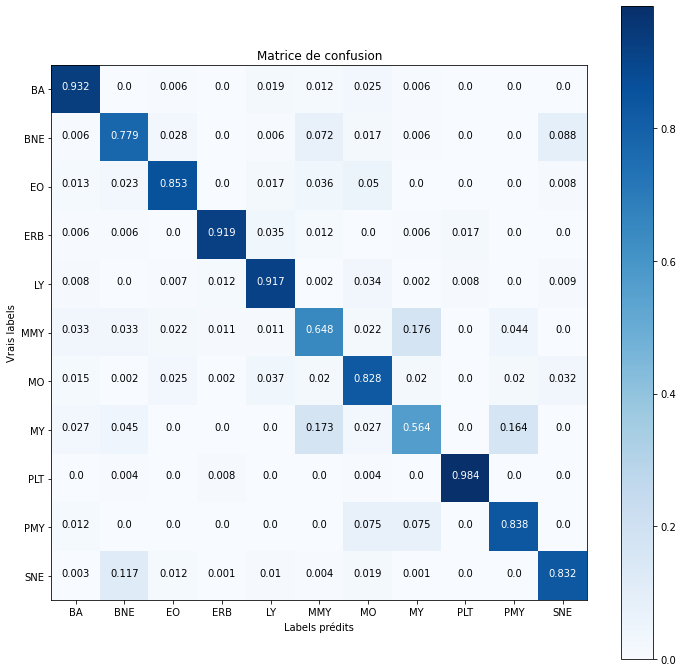

Classification Report : avant Fine-Tuning


,precision,recall,f1-score,support
BA,0.828729,0.931677,0.877193,161
BNE,0.51087,0.779006,0.617068,181
EO,0.918552,0.852941,0.884532,476
ERB,0.908046,0.918605,0.913295,172
LY,0.948417,0.917234,0.932565,882
MMY,0.468254,0.648352,0.543779,91
MO,0.787383,0.82801,0.807186,407
MY,0.632653,0.563636,0.596154,110
PLT,0.959839,0.983539,0.971545,243
PMY,0.690722,0.8375,0.757062,80


In [ ]:
y_pred, df_report = print_classification_report(testing_set, label_map, title = "Test")

In [ ]:
########################################################################## Fine-Tuning ##########################################################################

## Callbacks
TON = TerminateOnNaN()

control_lr = ReduceLROnPlateau(monitor = 'val_loss',
                               factor = 0.1, patience = 3, verbose = 1, mode = 'min', min_lr = 1e-7)
  
early_stopping = EarlyStopping(monitor = "val_loss",
                               patience = 4, mode = 'min', restore_best_weights = True)

save_during_training = ModelCheckpoint("/content/drive/MyDrive/Leukopy/VGG19_TL_11/model_alldata_train_ftblock5", 
                                       monitor = 'val_loss',
                                       save_best_only = True,
                                       save_weights_only = False,
                                       save_freq = 'epoch')

callbacks_list = [TON, control_lr, early_stopping, save_during_training]
                    
## Compute weights :
class_weights = compute_weights(method = 3)

## Unfreeze Block5 + Compile   (Rq: on pourrait essayer de dégeler block4 + block5)

for layer in model.layers:
  if "block5" in layer.name:
    layer.trainable = True

optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-5)
model.compile(optimizer = optimizer,
              loss = "categorical_crossentropy",
              metrics = ["accuracy"])

In [ ]:
## Training :
epochs = 60
fine_history = model.fit(x = training_set,
                         epochs = epochs,
                         callbacks = callbacks_list, 
                         validation_data = validation_set, 
                         class_weight = class_weights)

Epoch 1/60
943/943 [==============================] - 1064s 1s/step - loss: 2.5356 - accuracy: 0.8690 - val_loss: 0.3321 - val_accuracy: 0.8787
INFO:tensorflow:Assets written to: /content/drive/MyDrive/Leukopy/VGG19_TL_11/model_alldata_train_ftblock5/assets
Epoch 2/60
943/943 [==============================] - 1043s 1s/step - loss: 2.0240 - accuracy: 0.8978 - val_loss: 0.2427 - val_accuracy: 0.9217
INFO:tensorflow:Assets written to: /content/drive/MyDrive/Leukopy/VGG19_TL_11/model_alldata_train_ftblock5/assets
Epoch 3/60
943/943 [==============================] - 1044s 1s/step - loss: 1.7359 - accuracy: 0.9092 - val_loss: 0.2073 - val_accuracy: 0.9228
INFO:tensorflow:Assets written to: /content/drive/MyDrive/Leukopy/VGG19_TL_11/model_alldata_train_ftblock5/assets
Epoch 4/60
943/943 [==============================] - 1052s 1s/step - loss: 1.6879 - accuracy: 0.9138 - val_loss: 0.2245 - val_accuracy: 0.9188
Epoch 5/60
943/943 [==============================] - 1039s 1s/step - loss: 1.5601

In [ ]:
model.save("/content/drive/MyDrive/Leukopy/VGG19_TL_11/model_alldata_ftblock5")

INFO:tensorflow:Assets written to: /content/drive/MyDrive/Leukopy/VGG19_TL_11/model_alldata_ftblock5/assets
INFO:tensorflow:Assets written to: /content/drive/MyDrive/Leukopy/VGG19_TL_11/model_alldata_ftblock5/assets


In [ ]:
############################################################################ ANALYSE DES RÉSULTATS #########################################################################################

In [56]:
model = load_model("/content/drive/MyDrive/Leukopy/VGG19_TL_11/model_alldata_ftblock5")

In [16]:
## Test :
model.evaluate(testing_set)

118/118 [==============================] - 52s 261ms/step - loss: 0.1720 - accuracy: 0.9369


[0.17200204730033875, 0.936853289604187]

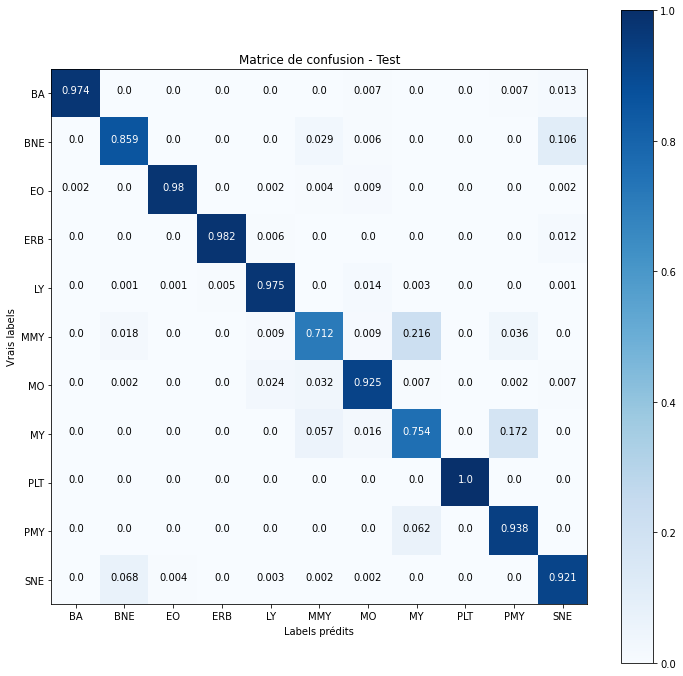

Classification Report - Test


,precision,recall,f1-score,support
BA,0.993333,0.973856,0.983498,153
BNE,0.669725,0.858824,0.752577,170
EO,0.988938,0.980263,0.984581,456
ERB,0.97619,0.982036,0.979104,167
LY,0.981481,0.974713,0.978085,870
MMY,0.731481,0.711712,0.721461,111
MO,0.943069,0.924757,0.933824,412
MY,0.730159,0.754098,0.741935,122
PLT,1,1,1,245
PMY,0.689655,0.9375,0.794702,64


In [20]:
### 1 -- Rapport de classification :
y_pred, df_report = print_classification_report(testing_set, label_map, title = "Test")

In [21]:
### 2 -- DataFrames pour l'exploitation
# DF avec le résultat et le label de toutes les images du test :
df_results = pd.DataFrame(data = {"real":testing_set.classes,
                                  "pred":y_pred, 
                                  "img_path":df_test["img_path"]})

# Tri des images : mal classé (df_false), bien classé (df_true):
df_false = df_results[df_results["real"] != df_results["pred"]].reset_index(drop = True)
df_true = df_results[df_results["real"] == df_results["pred"]].reset_index(drop = True)

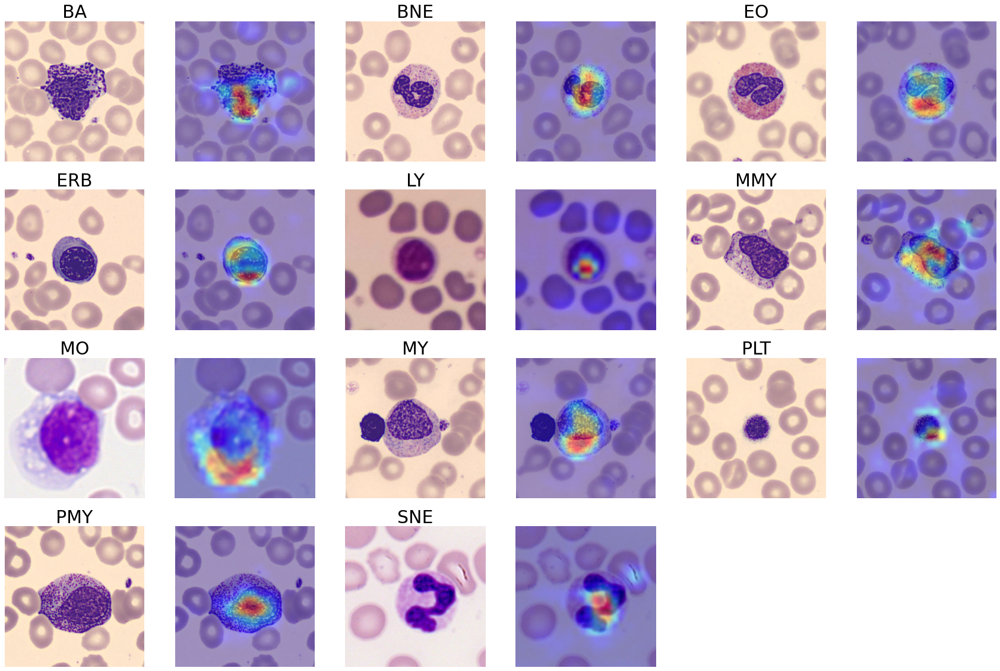

In [22]:
### 3 -- Grad-CAM sur les images bien classées

from IPython.display import Image, display
import matplotlib.cm as cm

fig_gc = plt.figure(figsize = (30,20))
i = 1
for label in np.arange(0,11):

  # Tire un index au hasard parmi les index d'une même classe de cellules
  df_temp = df_true[df_true["real"] == label]
  idx = np.random.choice(a = df_temp.index)
        
  img_path = df_temp.loc[idx,"img_path"]

  # Grad-CAM Heatmap + superposition
  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

  plt.subplot(4,6,i)
  plt.imshow(plt.imread(img_path))
  plt.title(list(label_map.keys())[label], fontsize = 30)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(4,6,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  i+=2

plt.savefig("/content/drive/MyDrive/Leukopy/VGG19_TL_11/ALLDATA_GradCAM")

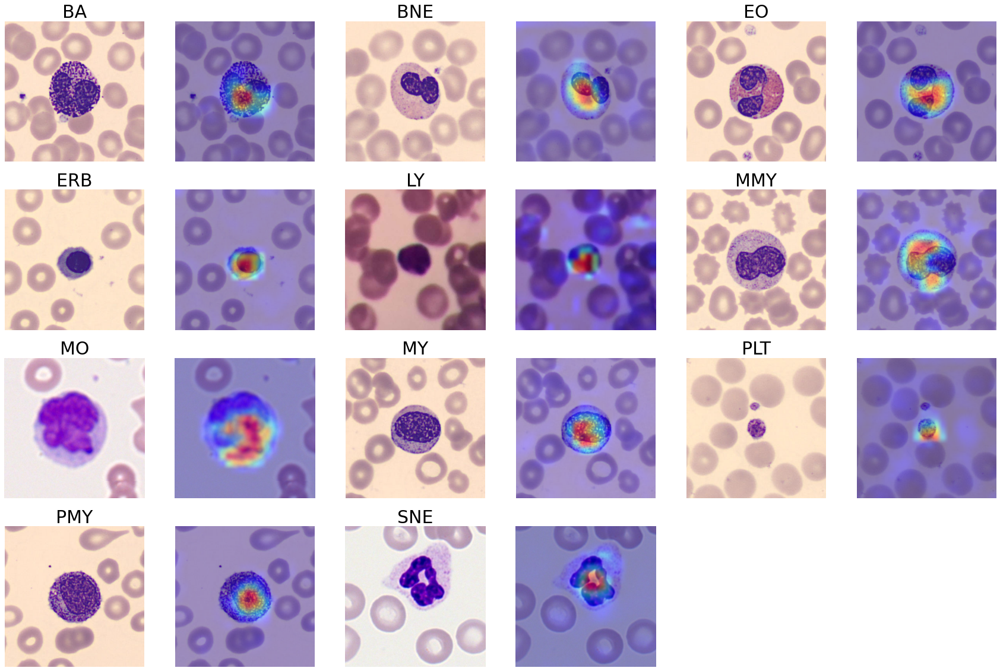

In [90]:
### 3bis -- Grad-CAM sur les images bien classées

from IPython.display import Image, display
import matplotlib.cm as cm

fig_gc = plt.figure(figsize = (30,20))
i = 1
for label in np.arange(0,11):

  # Tire un index au hasard parmi les index d'une même classe de cellules
  df_temp = df_true[df_true["real"] == label]
  idx = np.random.choice(a = df_temp.index)
        
  img_path = df_temp.loc[idx,"img_path"]

  # Grad-CAM Heatmap + superposition
  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

  plt.subplot(4,6,i)
  plt.imshow(plt.imread(img_path))
  plt.title(list(label_map.keys())[label], fontsize = 30)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(4,6,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  i+=2

plt.savefig("/content/drive/MyDrive/Leukopy/VGG19_TL_11/ALLDATA_GradCAM_2")

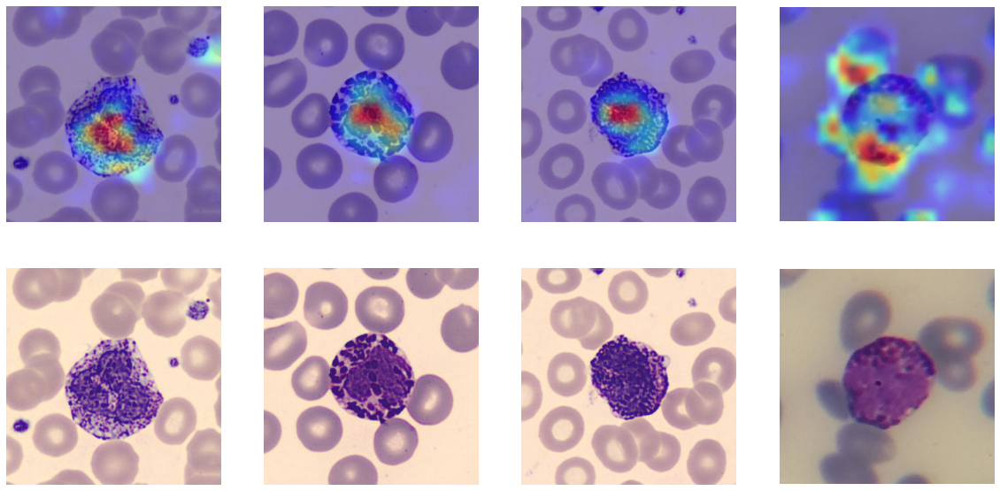

In [91]:
## Cas des BA classés correctement : on en affiche plusieurs pour voir si on obtient le même type de carte thermique

df_BA = df_true[df_true["real"] == 0]

fig = plt.figure(figsize = (20,10))

for i in range(4):
  idx = np.random.choice(a = df_BA.index)
  img_path = df_BA.loc[idx,"img_path"]

  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

  plt.subplot(2,4,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(2,4,i+5)
  plt.imshow(plt.imread(img_path))
  plt.grid(None)
  plt.axis('off')

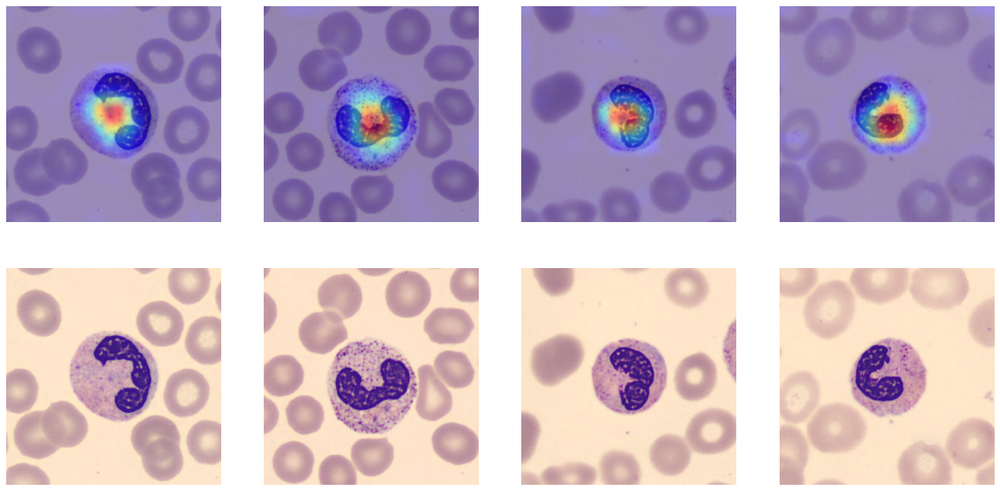

In [30]:
## Cas des BNE classés correctement : on en affiche plusieurs pour voir si on obtient le même type de carte thermique

df_BNE = df_true[df_true["real"] == 1]

fig = plt.figure(figsize = (20,10))

for i in range(4):
  idx = np.random.choice(a = df_BNE.index)
  img_path = df_BNE.loc[idx,"img_path"]

  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

  plt.subplot(2,4,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(2,4,i+5)
  plt.imshow(plt.imread(img_path))
  plt.grid(None)
  plt.axis('off')

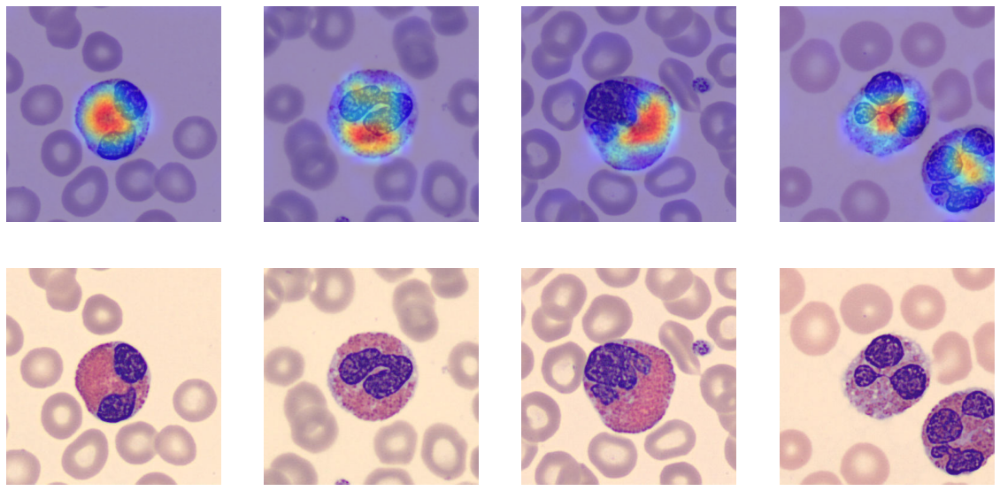

In [93]:
## Cas des EO classés correctement : on en affiche plusieurs pour voir si on obtient le même type de carte thermique

df_EO = df_true[df_true["real"] == 2]

fig = plt.figure(figsize = (20,10))

for i in range(4):
  idx = np.random.choice(a = df_EO.index)
  img_path = df_EO.loc[idx,"img_path"]

  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

  plt.subplot(2,4,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(2,4,i+5)
  plt.imshow(plt.imread(img_path))
  plt.grid(None)
  plt.axis('off')

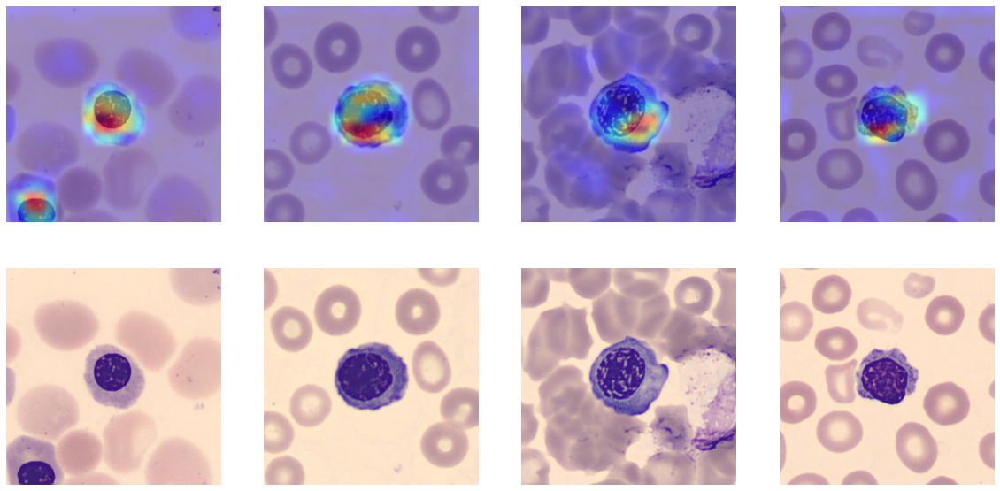

In [34]:
## Cas des ERB classés correctement : on en affiche plusieurs pour voir si on obtient le même type de carte thermique

df_ERB = df_true[df_true["real"] == 3]

fig = plt.figure(figsize = (20,10))

for i in range(4):
  idx = np.random.choice(a = df_LY.index)
  img_path = df_ERB.loc[idx,"img_path"]

  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

  plt.subplot(2,4,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(2,4,i+5)
  plt.imshow(plt.imread(img_path))
  plt.grid(None)
  plt.axis('off')

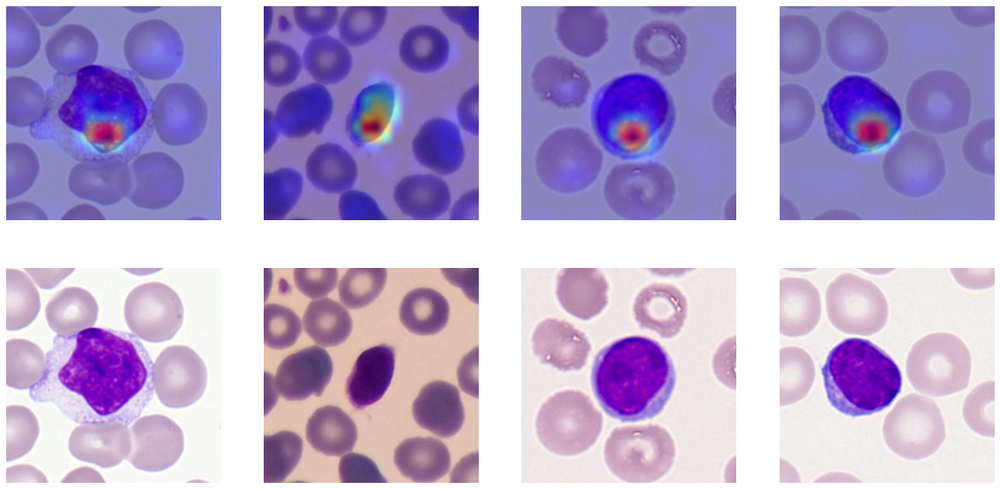

In [35]:
## Cas des LY classés correctement : on en affiche plusieurs pour voir si on obtient le même type de carte thermique

df_LY = df_true[df_true["real"] == 4]

fig = plt.figure(figsize = (20,10))

for i in range(4):
  idx = np.random.choice(a = df_LY.index)
  img_path = df_LY.loc[idx,"img_path"]

  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

  plt.subplot(2,4,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(2,4,i+5)
  plt.imshow(plt.imread(img_path))
  plt.grid(None)
  plt.axis('off')

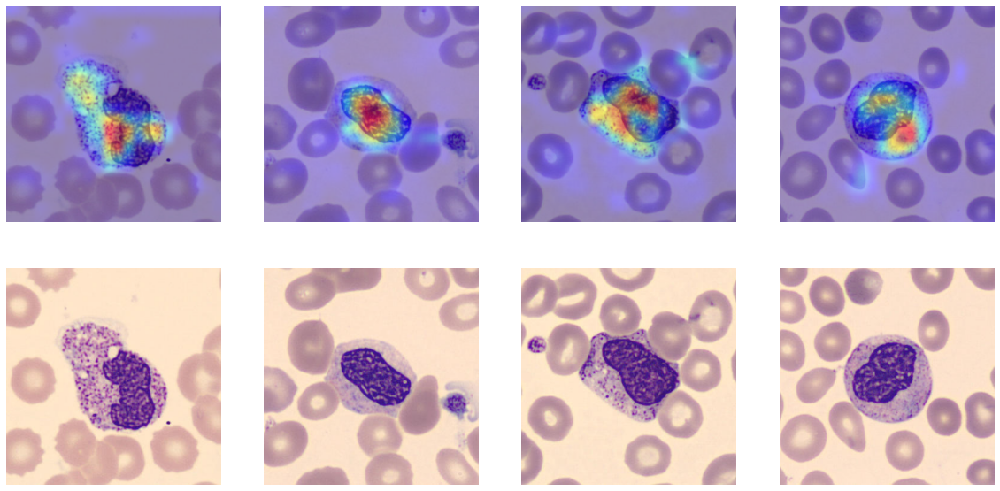

In [39]:
## Cas des MMY classés correctement : on en affiche plusieurs pour voir si on obtient le même type de carte thermique

df_MMY = df_true[df_true["real"] == 5]

fig = plt.figure(figsize = (20,10))

for i in range(4):
  idx = np.random.choice(a = df_MMY.index)
  img_path = df_MMY.loc[idx,"img_path"]

  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

  plt.subplot(2,4,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(2,4,i+5)
  plt.imshow(plt.imread(img_path))
  plt.grid(None)
  plt.axis('off')

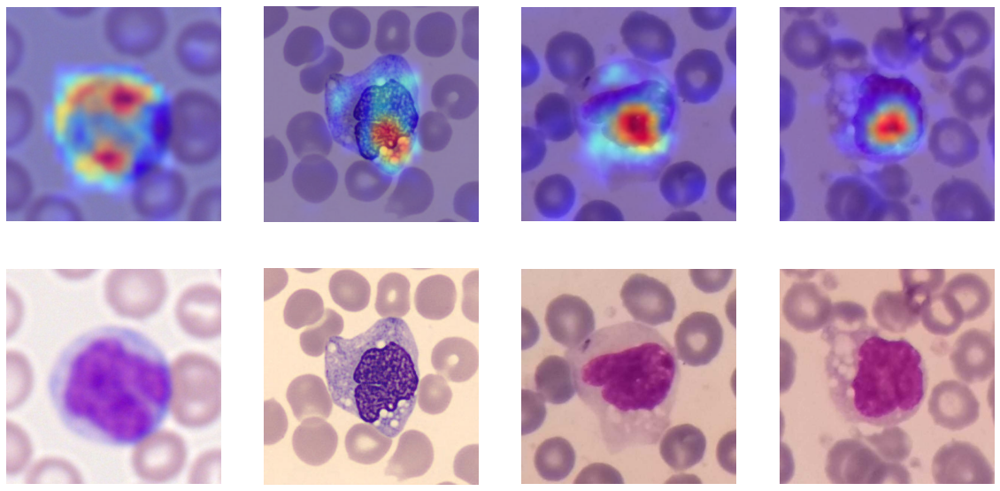

In [37]:
## Cas des MO classés correctement : on en affiche plusieurs pour voir si on obtient le même type de carte thermique

df_MO = df_true[df_true["real"] == 6]

fig = plt.figure(figsize = (20,10))

for i in range(4):
  idx = np.random.choice(a = df_MO.index)
  img_path = df_MO.loc[idx,"img_path"]

  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

  plt.subplot(2,4,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(2,4,i+5)
  plt.imshow(plt.imread(img_path))
  plt.grid(None)
  plt.axis('off')

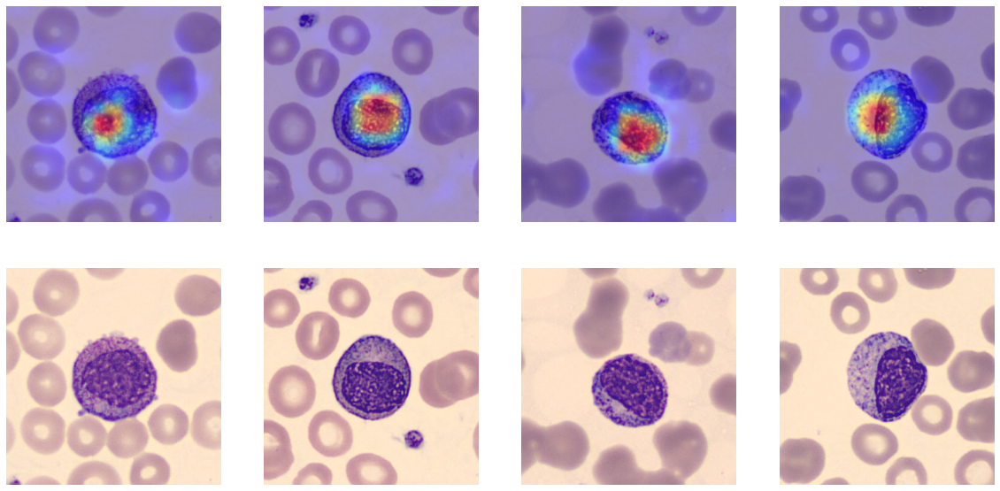

In [40]:
## Cas des MY classés correctement : on en affiche plusieurs pour voir si on obtient le même type de carte thermique

df_MY = df_true[df_true["real"] == 7]

fig = plt.figure(figsize = (20,10))

for i in range(4):
  idx = np.random.choice(a = df_MY.index)
  img_path = df_MY.loc[idx,"img_path"]

  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

  plt.subplot(2,4,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(2,4,i+5)
  plt.imshow(plt.imread(img_path))
  plt.grid(None)
  plt.axis('off')

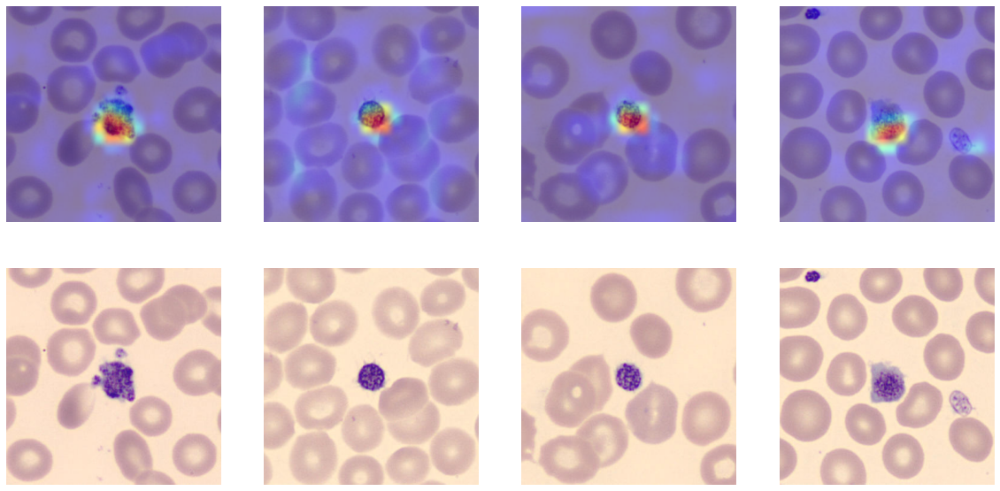

In [42]:
## Cas des PLT classés correctement : on en affiche plusieurs pour voir si on obtient le même type de carte thermique

df_PLT = df_true[df_true["real"] == 8]

fig = plt.figure(figsize = (20,10))

for i in range(4):
  idx = np.random.choice(a = df_PLT.index)
  img_path = df_PLT.loc[idx,"img_path"]

  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

  plt.subplot(2,4,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(2,4,i+5)
  plt.imshow(plt.imread(img_path))
  plt.grid(None)
  plt.axis('off')

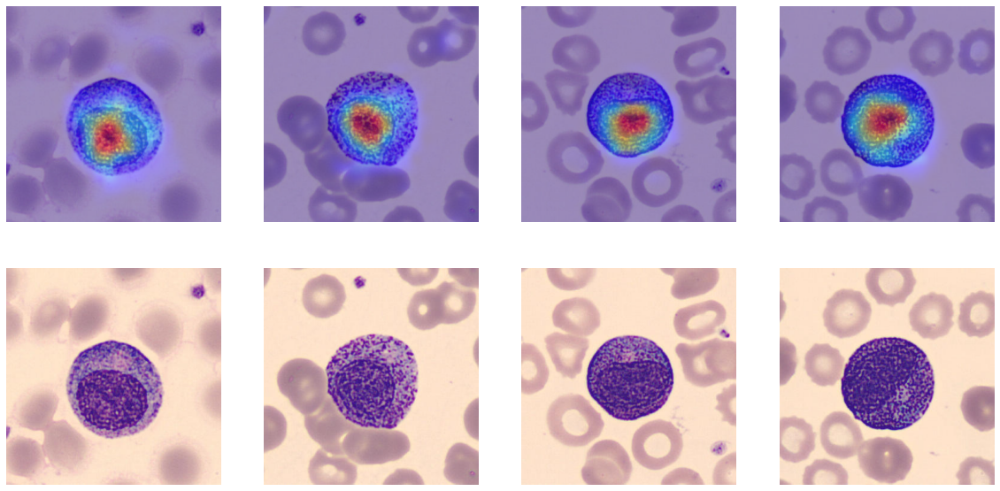

In [43]:
## Cas des PMY classés correctement : on en affiche plusieurs pour voir si on obtient le même type de carte thermique

df_PMY = df_true[df_true["real"] == 9]

fig = plt.figure(figsize = (20,10))

for i in range(4):
  idx = np.random.choice(a = df_PMY.index)
  img_path = df_PMY.loc[idx,"img_path"]

  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

  plt.subplot(2,4,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(2,4,i+5)
  plt.imshow(plt.imread(img_path))
  plt.grid(None)
  plt.axis('off')

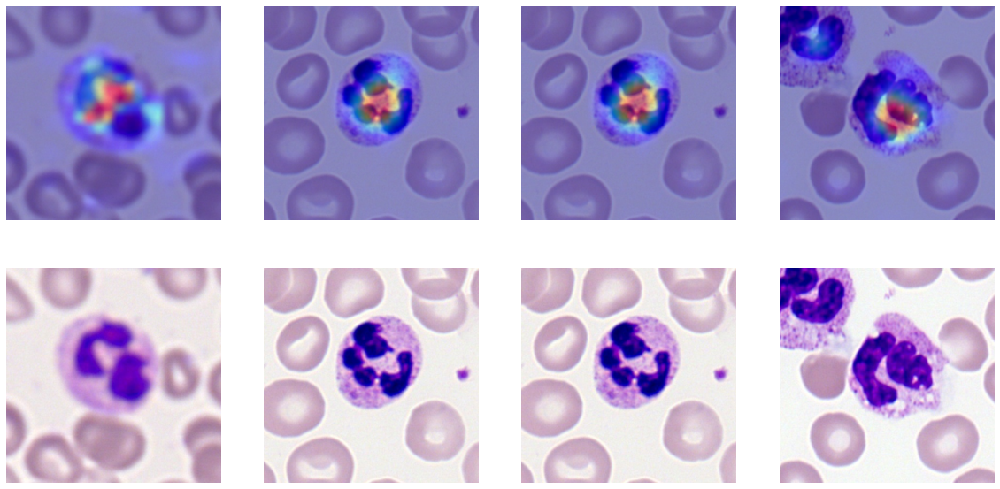

In [44]:
## Cas des SNE classés correctement : on en affiche plusieurs pour voir si on obtient le même type de carte thermique

df_SNE = df_true[df_true["real"] == 10]

fig = plt.figure(figsize = (20,10))

for i in range(4):
  idx = np.random.choice(a = df_SNE.index)
  img_path = df_SNE.loc[idx,"img_path"]

  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

  plt.subplot(2,4,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(2,4,i+5)
  plt.imshow(plt.imread(img_path))
  plt.grid(None)
  plt.axis('off')

In [61]:
### 4 -- Prédiction sur une image + Grad-CAM associée aux prédictions

def full_prediction(model, img_path, label, size = (img_height, img_width)):

  ## Preprocessing de l'image
  img = get_img_array(img_path, size = size)

  ## Prediction
  probas = model.predict(img)[0]
  sorted_indexes = np.flip(np.argsort(probas))
  sorted_classes = [classes[i] for i in sorted_indexes]
  sorted_probas = [probas[i] for i in sorted_indexes]
  
  ## Plot (3 classes les plus probables)
  fig = plt.figure(figsize = (12,12))

  ax1 = fig.add_subplot(2,2,1)
  ax1.imshow(plt.imread(img_path))
  ax1.text(x = 10, y = 25, s = 'P(%s) = %0.3f'%(sorted_classes[0], sorted_probas[0]), fontsize = 'xx-large')
  ax1.text(x = 10, y = 55, s = 'P(%s) = %0.3f'%(sorted_classes[1], sorted_probas[1]), fontsize = 'xx-large')
  ax1.text(x = 10, y = 85, s = 'P(%s) = %0.3f'%(sorted_classes[2], sorted_probas[2]), fontsize = 'xx-large')
  ax1.set_title('True label : '+label+'\nPath : '+img_path)
  plt.grid(None)
  plt.axis('off')

  ax2 = fig.add_subplot(2,2,2)
  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, 
                                          class_index = sorted_indexes[0], alpha = 0.8, plot = False)
  ax2.imshow(superimposed_img)
  ax2.set_title('Grad-CAM for '+sorted_classes[0], fontsize = 24)
  plt.grid(None)
  plt.axis('off')

  ax3 = fig.add_subplot(2,2,3)
  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, 
                                          class_index = sorted_indexes[1], alpha = 0.8, plot = False)
  ax3.imshow(superimposed_img)
  ax3.set_title('Grad-CAM for '+sorted_classes[1], fontsize = 24)
  plt.grid(None)
  plt.axis('off')

  ax4 = fig.add_subplot(2,2,4)
  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, 
                                          class_index = sorted_indexes[2], alpha = 0.8, plot = False)
  ax4.imshow(superimposed_img)
  ax4.set_title('Grad-CAM for '+sorted_classes[2], fontsize = 24)
  plt.grid(None)
  plt.axis('off')

  return probas, sorted_probas, sorted_classes

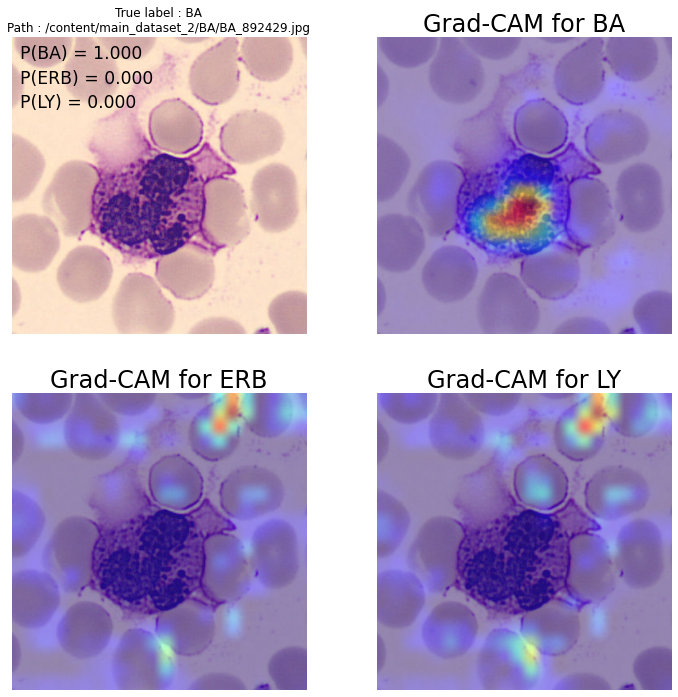

In [63]:
idx = np.random.choice(a = df_test[df_test["label"] == "BA"].index)

probas, sorted_probas, sorted_classes = full_prediction(model,
                                                        img_path = df_test.loc[idx,"img_path"],
                                                        label = df_test.loc[idx,"label"],
                                                        size = (img_height, img_width))

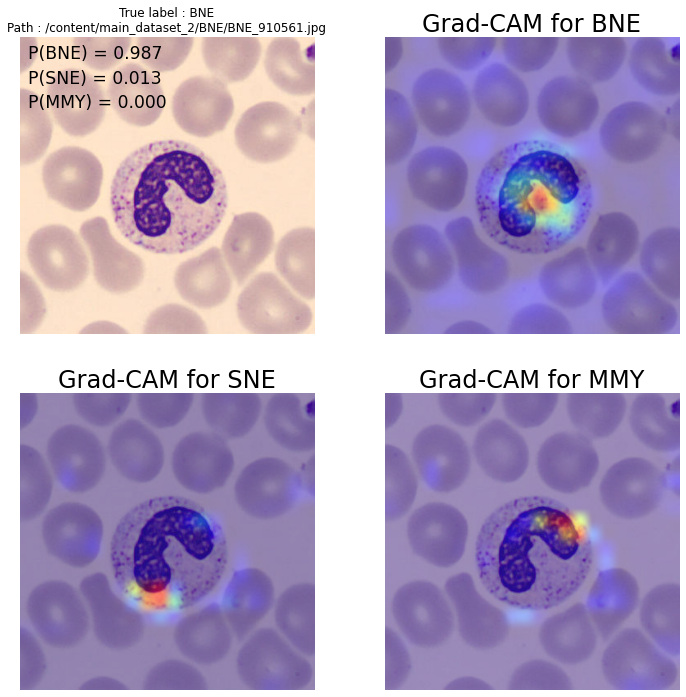

In [65]:
idx = np.random.choice(a = df_test[df_test["label"] == "BNE"].index)

probas, sorted_probas, sorted_classes = full_prediction(model,
                                                        img_path = df_test.loc[idx,"img_path"],
                                                        label = df_test.loc[idx,"label"],
                                                        size = (img_height, img_width))

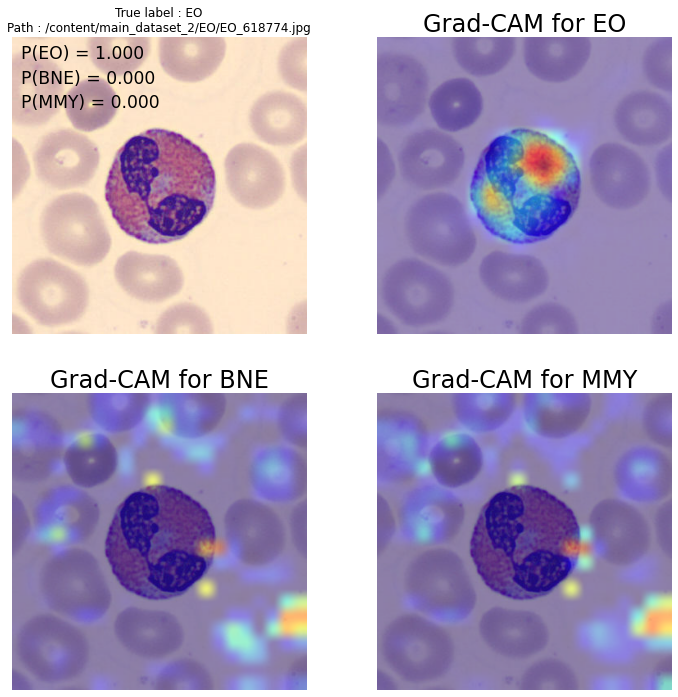

In [66]:
idx = np.random.choice(a = df_test[df_test["label"] == "EO"].index)

probas, sorted_probas, sorted_classes = full_prediction(model,
                                                        img_path = df_test.loc[idx,"img_path"],
                                                        label = df_test.loc[idx,"label"],
                                                        size = (img_height, img_width))

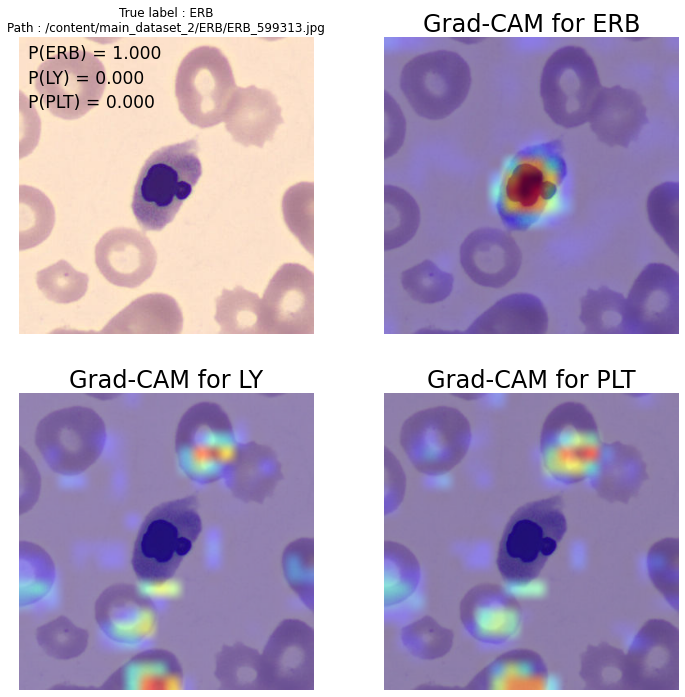

In [73]:
idx = np.random.choice(a = df_test[df_test["label"] == "ERB"].index)

probas, sorted_probas, sorted_classes = full_prediction(model,
                                                        img_path = df_test.loc[idx,"img_path"],
                                                        label = df_test.loc[idx,"label"],
                                                        size = (img_height, img_width))

# Il existe des cas pour lesquels la carte thermique est aberrante.

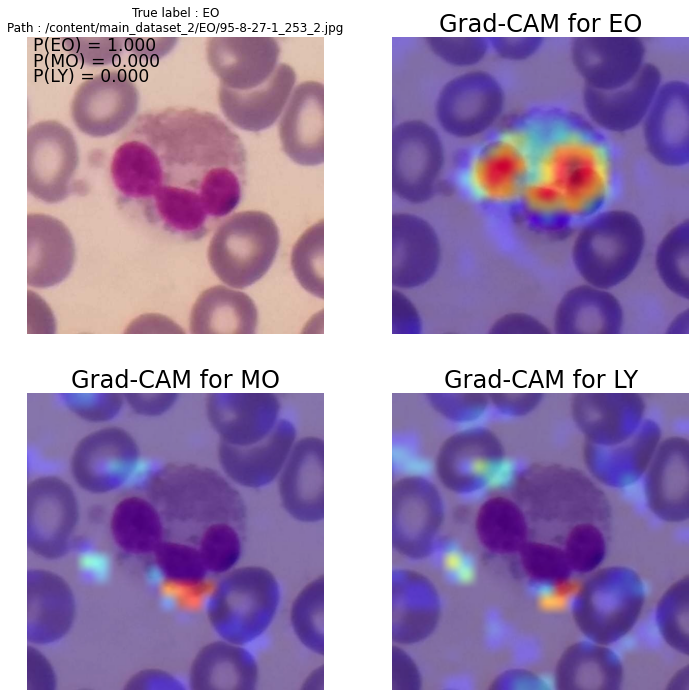

In [75]:
idx = np.random.choice(a = df_test[df_test["label"] == "EO"].index)

probas, sorted_probas, sorted_classes = full_prediction(model,
                                                        img_path = df_test.loc[idx,"img_path"],
                                                        label = df_test.loc[idx,"label"],
                                                        size = (img_height, img_width))

# Peut-être un risque d'erreur : les images de Raabin sont traitées avec des colorants différents. Ici, la couleur du noyau ressemble à la couleur des granules de Normal Barcelone ou de Munich.
# Il se pourrait donc que le modèle recherche la couleur, indépendamment de l'endroit où on la trouve sur l'image...

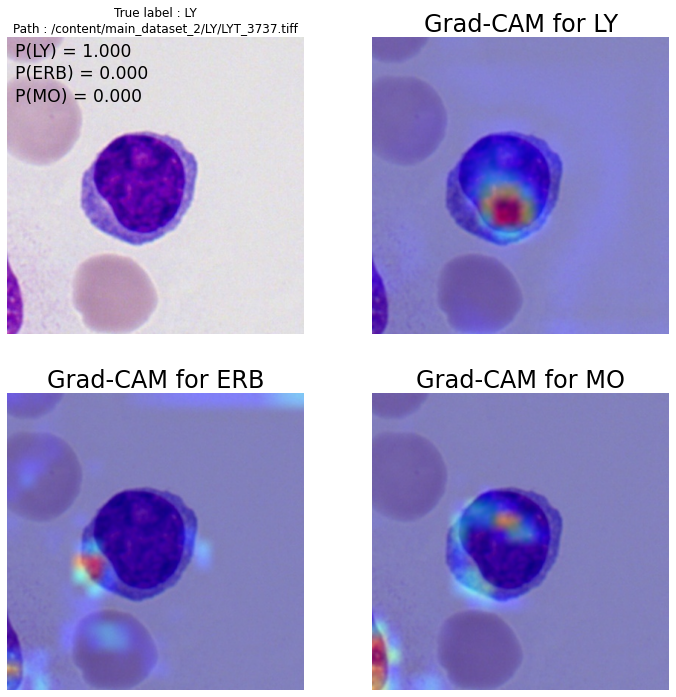

In [88]:
idx = np.random.choice(a = df_test[df_test["label"] == "LY"].index)

probas, sorted_probas, sorted_classes = full_prediction(model,
                                                        img_path = df_test.loc[idx,"img_path"],
                                                        label = df_test.loc[idx,"label"],
                                                        size = (img_height, img_width))

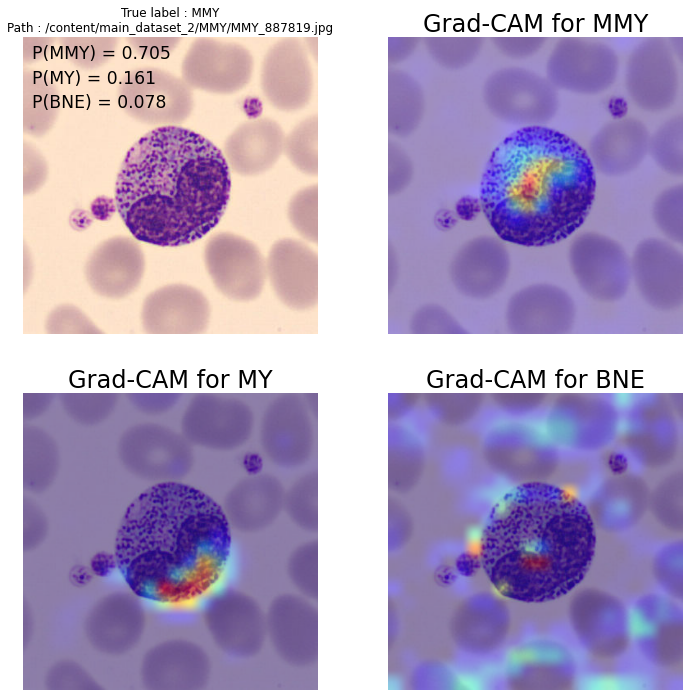

In [89]:
idx = np.random.choice(a = df_test[df_test["label"] == "MMY"].index)

probas, sorted_probas, sorted_classes = full_prediction(model,
                                                        img_path = df_test.loc[idx,"img_path"],
                                                        label = df_test.loc[idx,"label"],
                                                        size = (img_height, img_width))

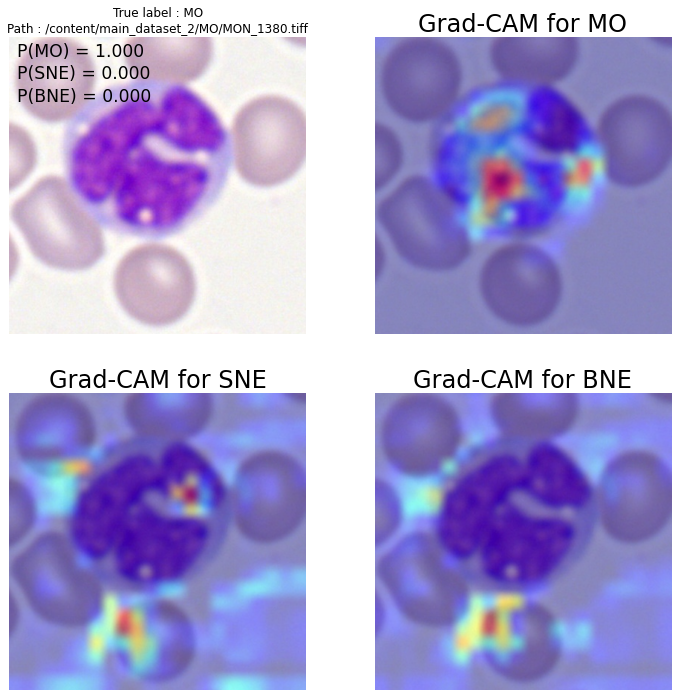

In [87]:
idx = np.random.choice(a = df_test[df_test["label"] == "MO"].index)

probas, sorted_probas, sorted_classes = full_prediction(model,
                                                        img_path = df_test.loc[idx,"img_path"],
                                                        label = df_test.loc[idx,"label"],
                                                        size = (img_height, img_width))


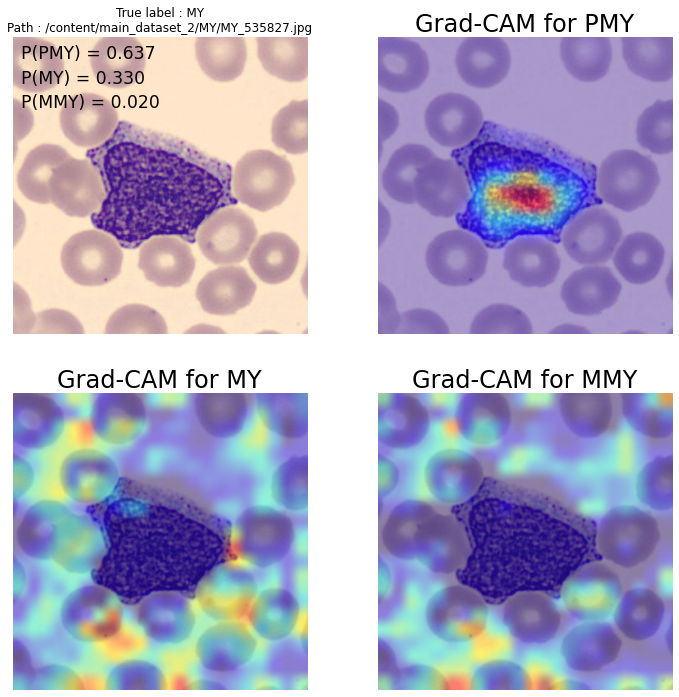

In [86]:
idx = np.random.choice(a = df_test[df_test["label"] == "MY"].index)

probas, sorted_probas, sorted_classes = full_prediction(model,
                                                        img_path = df_test.loc[idx,"img_path"],
                                                        label = df_test.loc[idx,"label"],
                                                        size = (img_height, img_width))

# Erreur de classement, mais le modèle hésite fortement : 33% en faveur de la classe correcte.

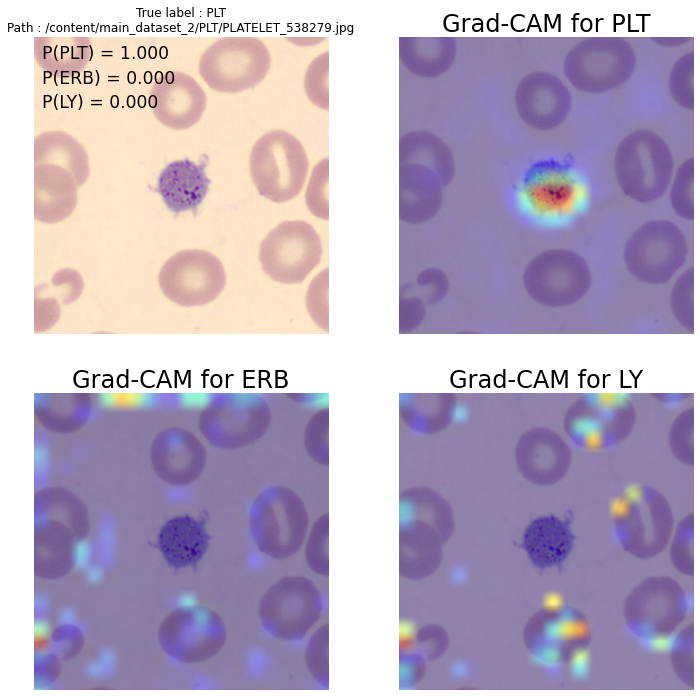

In [81]:
idx = np.random.choice(a = df_test[df_test["label"] == "PLT"].index)

probas, sorted_probas, sorted_classes = full_prediction(model,
                                                        img_path = df_test.loc[idx,"img_path"],
                                                        label = df_test.loc[idx,"label"],
                                                        size = (img_height, img_width))

# Il y a du déchet pour un certain nombre d'images : parfois, le code ne regarde pas la cellule.

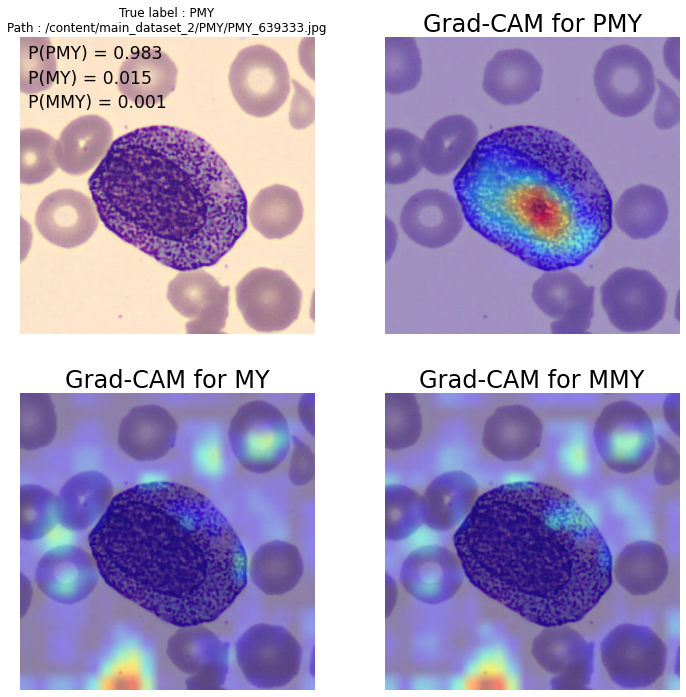

In [82]:
idx = np.random.choice(a = df_test[df_test["label"] == "PMY"].index)

probas, sorted_probas, sorted_classes = full_prediction(model,
                                                        img_path = df_test.loc[idx,"img_path"],
                                                        label = df_test.loc[idx,"label"],
                                                        size = (img_height, img_width))

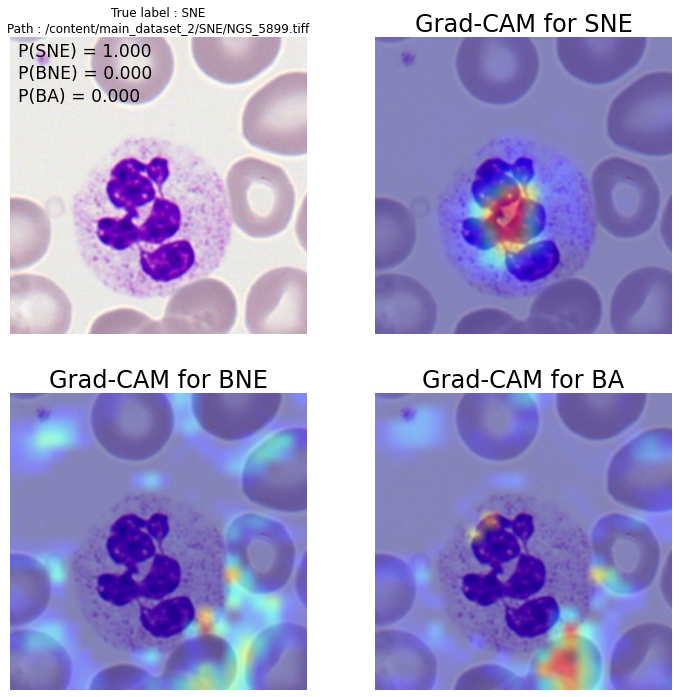

In [85]:
idx = np.random.choice(a = df_test[df_test["label"] == "SNE"].index)

probas, sorted_probas, sorted_classes = full_prediction(model,
                                                        img_path = df_test.loc[idx,"img_path"],
                                                        label = df_test.loc[idx,"label"],
                                                        size = (img_height, img_width))